In [2]:
# load detection labels
import pandas as pd

bbox_file_name_ap = 'AP_annotate.txt'
df_bbox_ap = pd.read_csv(bbox_file_name_ap, names = ['ID', 'x1', 'y1', 'x2', 'y2'])
bbox_file_name_lat = 'LAT_annotate.txt'
df_bbox_lat = pd.read_csv(bbox_file_name_lat, names = ['ID', 'x1', 'y1', 'x2', 'y2'])


In [9]:
import os
# load lat
implant_fn = os.path.join('..','KneeQualityAssurance','labels','smartQC_labeling_04172020.xlsx')
start_sheet = 0
df_lat_implantinfo = pd.read_excel(implant_fn, sheet_name = start_sheet, ignore_index = True)
# load all five sheets
num_of_sheets = 4
for i in range(start_sheet+1,start_sheet+num_of_sheets):
    df_lat_implantinfo = df_lat_implantinfo.append(pd.read_excel(implant_fn, sheet_name = i), ignore_index = True)
print(len(df_lat_implantinfo))
df_lat_implantinfo.tail()

1563


,ID,rule1,rule2,rule3,rule4,rule5,rule6,rule7,rule8,rule9,Comment,Metal Implants,disease,duplicates,blocklist,final
1558,W0573816_R.png,10.0,5.0,5.0,10.0,5.0,10,10.0,5.0,5.0,NaN,0,NaN,NaN,NaN,NaN
1559,W0573832_L.png,10.0,5.0,10.0,10.0,5.0,10,10.0,0.0,5.0,NaN,1,NaN,NaN,NaN,NaN
1560,W0573855_L.png,10.0,5.0,0.0,0.0,10.0,10,10.0,10.0,5.0,NaN,0,NaN,NaN,NaN,NaN
1561,W0573930_R.png,10.0,5.0,5.0,10.0,5.0,10,10.0,5.0,5.0,NaN,0,NaN,NaN,NaN,NaN
1562,W0573935_L.png,10.0,5.0,10.0,10.0,10.0,10,10.0,5.0,5.0,NaN,0,NaN,NaN,NaN,NaN


In [7]:
import os
# load ap
implant_fn = os.path.join('..','KneeQualityAssurance','labels','smartQC_labeling_04172020.xlsx')
start_sheet = 4
df_ap_implantinfo = pd.read_excel(implant_fn, sheet_name = start_sheet, ignore_index = True)
# load all five sheets
num_of_sheets = 4
for i in range(start_sheet + 1, start_sheet + num_of_sheets):
    df_ap_implantinfo = df_ap_implantinfo.append(pd.read_excel(implant_fn, sheet_name = i), ignore_index = True)
print(len(df_ap_implantinfo))
df_ap_implantinfo.head()

1585


,ID,rule1,rule2,rule3,rule4,rule5,rule6,rule7,rule8,rule9,Comment,Metal Implants,disease,duplicates,blocklist,final
0,D3662401_L.png,10.0,5.0,5.0,5.0,0.0,10.0,10.0,10.0,5.0,NaN,0,NaN,NaN,NaN,NaN
1,D3662401_R.png,10.0,5.0,5.0,5.0,5.0,10.0,10.0,5.0,5.0,NaN,0,NaN,NaN,NaN,NaN
2,D3662464_L.png,10.0,5.0,5.0,5.0,10.0,10.0,10.0,5.0,5.0,NaN,0,NaN,NaN,NaN,NaN
3,D3663249_L.png,10.0,5.0,5.0,0.0,0.0,5.0,10.0,5.0,5.0,NaN,0,2.0,NaN,NaN,NaN
4,D3663354_L.png,10.0,5.0,5.0,0.0,5.0,5.0,10.0,10.0,5.0,NaN,0,2.0,NaN,NaN,NaN


In [5]:
df_bbox_ap = df_bbox_ap.set_index('ID')
df_ap_implantinfo = df_ap_implantinfo.set_index('ID')
df_AP = df_bbox_ap.join(df_ap_implantinfo)

In [12]:
df_bbox_lat = df_bbox_lat.set_index('ID')
df_lat_implantinfo = df_lat_implantinfo.set_index('ID')
df_LAT = df_bbox_lat.join(df_lat_implantinfo)

In [7]:
df_AP[df_AP['Metal Implants'].isnull()]

,x1,y1,x2,y2,rule1,rule2,rule3,rule4,rule5,rule6,rule7,rule8,rule9,Comment,Metal Implants,disease,duplicates,blocklist,final
ID,,,,,,,,,,,,,,,,,,,


In [13]:
df_LAT[df_LAT['Metal Implants'].isnull()]

,x1,y1,x2,y2,rule1,rule2,rule3,rule4,rule5,rule6,rule7,rule8,rule9,Comment,Metal Implants,disease,duplicates,blocklist,final
ID,,,,,,,,,,,,,,,,,,,


In [14]:
from shutil import copyfile
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
import os

def trainTestStratifiedSampling(df, random_state = 12, test_size = 0.2):    
    label_choices = {'0':'0', '1':'1'}
    split = StratifiedShuffleSplit(n_splits=1, test_size=test_size, random_state=random_state)
    # get strafitied train and test set
    for train_index, test_index in split.split(df, df['Metal Implants']):
        strat_train_set = df.iloc[train_index]
        strat_test_set = df.iloc[test_index]
                               
    return strat_train_set, strat_test_set

In [8]:
strat_train_set_ap, strat_test_set_ap = trainTestStratifiedSampling(df_AP)

In [15]:
strat_train_set_lat, strat_test_set_lat = trainTestStratifiedSampling(df_LAT)

In [16]:
#  len(strat_test_set_ap)
print(len(strat_train_set_lat),len(strat_test_set_lat))

1246 312


In [12]:
import math
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
metal_in_testing = strat_test_set_ap[strat_test_set_ap['Metal Implants']==1]

fig,axes = plt.subplots(nrows = math.ceil(len(metal_in_testing)/4), ncols = 4, figsize=(50,50))

for i, image_fn in enumerate(list(metal_in_testing.index)):
    src_path = os.path.join('..','KneeQualityAssurance','data','Data', 'ap', 'png_all')
    # img = cv2.imread(os.path.join(src_path, image_fn),flags = cv2.IMREAD_ANYCOLOR | cv2.IMREAD_ANYDEPTH)
    img = np.array(Image.open(os.path.join(src_path, image_fn)))
    axes[i//4,i%4].imshow(img, cmap='bone')


NameError: name 'strat_test_set_ap' is not defined

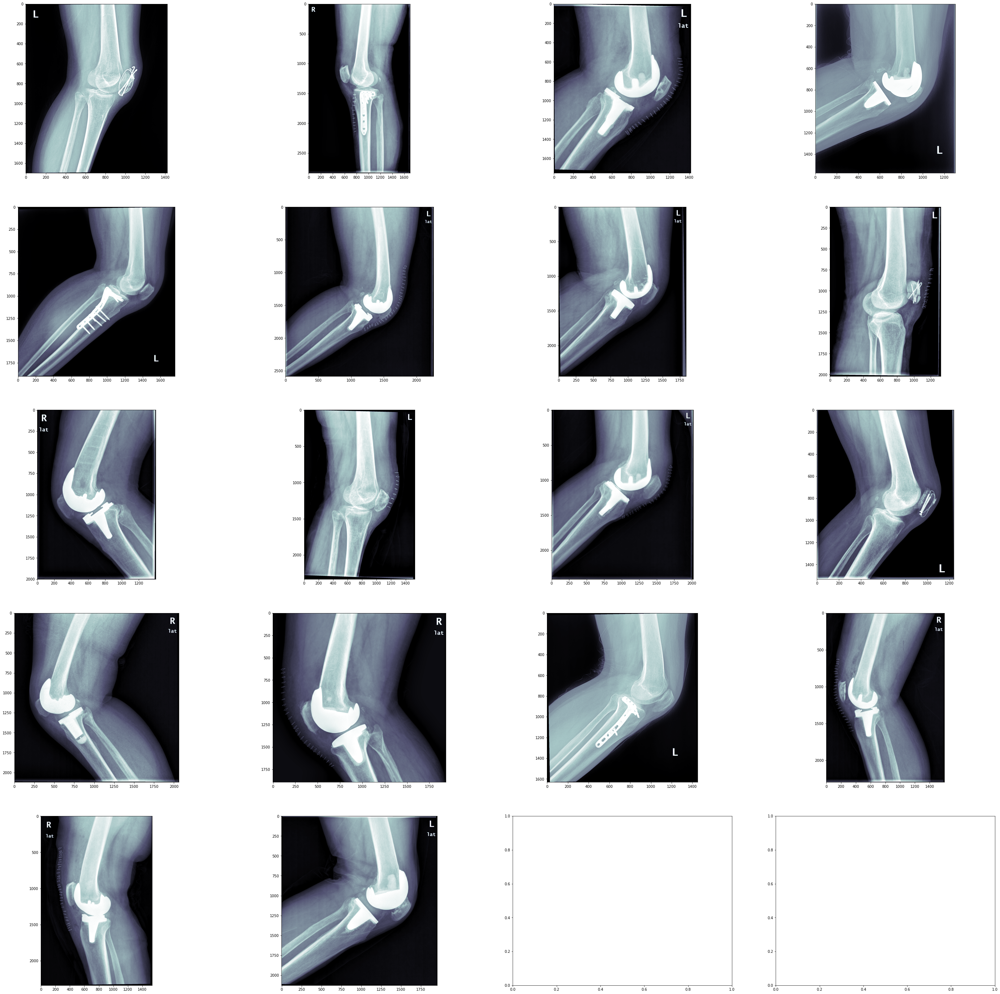

In [13]:
import math
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
metal_in_testing = strat_test_set_lat[strat_test_set_lat['Metal Implants']==1]

fig,axes = plt.subplots(nrows = math.ceil(len(metal_in_testing)/4), ncols = 4, figsize=(50,50))

for i, image_fn in enumerate(list(metal_in_testing.index)):
    src_path = os.path.join('..','KneeQualityAssurance','data','Data', 'lat', 'png_all')
    # img = cv2.imread(os.path.join(src_path, image_fn),flags = cv2.IMREAD_ANYCOLOR | cv2.IMREAD_ANYDEPTH)
    img = np.array(Image.open(os.path.join(src_path, image_fn)))
    axes[i//4,i%4].imshow(img, cmap='bone')


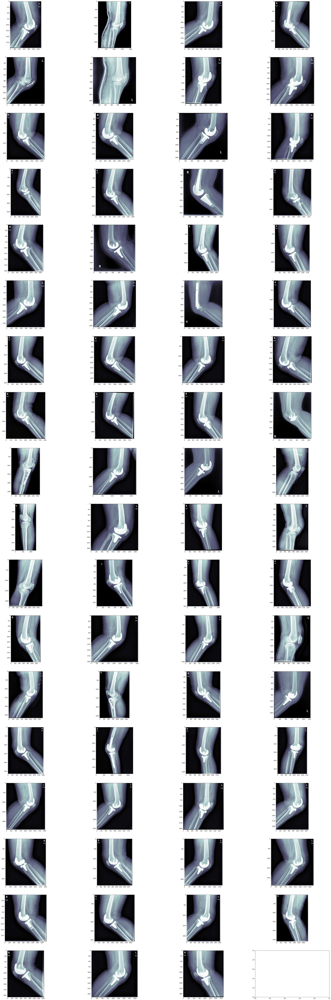

In [16]:
import math
import os
import cv2
import matplotlib.pyplot as plt
from PIL import Image
%matplotlib inline
metal_in_training = strat_train_set_lat[strat_train_set_lat['Metal Implants']==1]

fig,axes = plt.subplots(nrows = math.ceil(len(metal_in_training)/4), ncols = 4, figsize=(50,150))

for i, image_fn in enumerate(list(metal_in_training.index)):
    src_path = os.path.join('..','KneeQualityAssurance','data','Data', 'lat', 'png_all')
    # img = cv2.imread(os.path.join(src_path, image_fn),flags = cv2.IMREAD_ANYCOLOR | cv2.IMREAD_ANYDEPTH)
    img = np.array(Image.open(os.path.join(src_path, image_fn)))
    axes[i//4,i%4].imshow(img, cmap='bone')


In [12]:
train_ap_fn = 'train_labeled_ap_metal.txt'
with open(train_ap_fn, 'w') as file:
    file.write(strat_train_set_ap.to_csv(header=False, index=True))

test_ap_fn = 'test_labeled_ap_metal.txt'   
with open(test_ap_fn, 'w') as file:
    file.write(strat_test_set_ap.to_csv(header=False, index=True))

In [30]:
train_lat_fn = 'train_labeled_lat_metal.txt'
with open(train_lat_fn, 'w') as file:
    file.write(strat_train_set_lat.to_csv(header=False, index=True))

test_lat_fn = 'test_labeled_lat_metal.txt'   
with open(test_lat_fn, 'w') as file:
    file.write(strat_test_set_lat.to_csv(header=False, index=True))

## Cross-validation

In [17]:
from sklearn.model_selection import StratifiedKFold

from shutil import copyfile
import numpy as np
from sklearn.model_selection import StratifiedShuffleSplit
import os

def trainTestStratifiedSampling(df, random_state = 12, n_splits = 3):    
    split = StratifiedKFold(n_splits= n_splits, shuffle=True, random_state = random_state)
    # get strafitied train and test set
    strat_train_set = {}
    strat_test_set = {}
    fold = 0
    for train_index, test_index in split.split(df, df['Metal Implants']):
        fold = fold+1
        fold_name = 'fold' + str(fold)
        strat_train_set_fold = df.iloc[train_index]
        strat_test_set_fold = df.iloc[test_index]
        strat_train_set[fold_name] = strat_train_set_fold
        strat_test_set[fold_name] = strat_test_set_fold
                               
    return strat_train_set, strat_test_set

In [17]:
strat_train_set_ap, strat_test_set_ap = trainTestStratifiedSampling(df_AP)

In [21]:
num_folds = 3
for fold in range(1,num_folds+1):
    train_ap_fn = 'train_labeled_ap_metal' + '_fold' + str(fold) + '.txt'
    with open(train_ap_fn, 'w') as file:
        file.write(strat_train_set_ap['fold'+str(fold)][['x1','y1','x2','y2','Metal Implants']].to_csv(header=False, index=True))
        
    test_ap_fn = 'test_labeled_ap_metal' + '_fold' + str(fold) + '.txt'
    with open(test_ap_fn, 'w') as file:
        file.write(strat_test_set_ap['fold'+str(fold)][['x1','y1','x2','y2','Metal Implants']].to_csv(header=False, index=True))

In [18]:
strat_train_set_lat, strat_test_set_lat = trainTestStratifiedSampling(df_LAT)

In [19]:
num_folds = 3
for fold in range(1,num_folds+1):
    train_lat_fn = 'train_labeled_lat_metal' + '_fold' + str(fold) + '.txt'
    with open(train_lat_fn, 'w') as file:
        file.write(strat_train_set_lat['fold'+str(fold)][['x1','y1','x2','y2','Metal Implants']].to_csv(header=False, index=True))
        
    test_lat_fn = 'test_labeled_lat_metal' + '_fold' + str(fold) + '.txt'
    with open(test_lat_fn, 'w') as file:
        file.write(strat_test_set_lat['fold'+str(fold)][['x1','y1','x2','y2','Metal Implants']].to_csv(header=False, index=True))